Plots for Case 7: 4 Jan, 23:00 and other cloudy cases in the thesis, only trajectories and paper version

__Basemap will only load correctly in myenv1. Activate it via terminal before opening the notebook__

Created new environment for basemap work_env_basemap

# Plotting Profiles

In [1]:
from traj_check import trajcheck
from traj_plot import traj_plot
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from datetime import datetime
import metpy.calc as mcalc
from metpy.units import units
from station_plot import plot_station
from sounding_finder import sounding_finder
# Loading sounding data at sheba
from sheba_df import sheba_df
from meteo import spec_humidity
from sounding_df import sounding_df as sd

from siphon.simplewebservice.igra2 import IGRAUpperAir

from mpl_toolkits.basemap import Basemap

from netCDF4 import Dataset
from netCDF4 import date2index

# path to all trajectory files
path_traj= '/home/ollie/muali/Data/winter_all/'

# 4th Jan 23:00

In [5]:
# sheba df 4th Jan 23:00
df_she7 = sheba_df('/home/ollie/muali/data_work/Sounding_data/unzipped_data/1998_01_ascii/y1042316.she', dropnan=True)
she7 = sd(df_she7)

q_she7 = she7.spec_humidity()
rh_she7 = she7.relative_humidity()
rhi_she7 = she7.relative_humidity_ice()
#tpw_she7 = she7.tpw()
# throws up tuple indices error
pot_she7 = she7.potential_t()

In [6]:
df_she7.head()

,Time,pressure,temperature,dewpoint,relative_humidity,Uwind,Vwind,Wspd,Dir,dZ,...,Lat,Rng,Az,Alt,Qp,Qt,Qh,Qu,Qv,Quv
0,0.0,1011.0,252.25,249.45,78.6,3.7,-0.5,3.8,277.8,10.2,...,74.875,999.0,999.0,19.7,99.0,99.0,99.0,99.0,99.0,99.0
1,1.0,1009.8,252.15,249.45,79.2,999.0,999.0,999.0,999.0,8.6,...,74.875,999.0,999.0,28.6,99.0,99.0,99.0,99.0,99.0,99.0
2,2.0,1008.9,252.05,249.45,79.6,3.0,-0.5,3.0,279.6,6.6,...,74.875,999.0,999.0,35.1,99.0,99.0,99.0,99.0,99.0,99.0
3,3.0,1008.2,252.05,249.35,79.7,2.8,-0.6,2.9,281.1,5.1,...,74.875,999.0,999.0,40.0,99.0,99.0,99.0,99.0,99.0,99.0
4,4.0,1007.6,251.95,249.35,79.8,2.8,-0.6,2.9,282.9,4.0,...,74.875,999.0,999.0,44.4,99.0,99.0,99.0,99.0,99.0,99.0


In [7]:
# 1st Jan 01:00 for 1850 and 31st Dec 20:00 for 2850 level
# on 31st Dec readings@ 5:00, 11, 17:00, 23:00
#df_ukm3026_1 = sounding_finder(file='UKM00003026', from_line='#UKM00003026 1997 12 31 17',\
#                           to_line='#UKM00003026 1997 12 31 23', to_print=1)
# no temperature readings on 31st Dec 17:00 sounding
df_ukm3026 = sounding_finder(file='UKM00003026', from_line='#UKM00003026 1997 12 31 23',\
                           to_line='#UKM00003026 1998 01 01', to_df=1)
ukm3026 = sd(df_ukm3026)
q_ukm3026 = ukm3026.spec_humidity()
rh_ukm3026 = ukm3026.relative_humidity()
rhi_ukm3026 = ukm3026.relative_humidity_ice()
pot_ukm3026 = ukm3026.potential_t()

In [8]:
#1998-01-01 21:00:00 JNM00001001 for 1850m
# 2 readings at 00 and 12:00
df_jnm1001 = sounding_finder(file='JNM00001001', from_line='#JNM00001001 1998 01 02',\
                           to_line='#JNM00001001 1998 01 02 12', to_df=1)
jnm1001 = sd(df_jnm1001)
q_jnm1001 = jnm1001.spec_humidity()
rh_jnm1001 = jnm1001.relative_humidity()
rhi_jnm1001 = jnm1001.relative_humidity_ice()
pot_jnm1001 = jnm1001.potential_t()

In [9]:
# 1998-01-02 09:00:00
# 2 readings at 11:00 and 23:00
df_glm4320 = sounding_finder(file='GLM00004320', from_line='#GLM00004320 1998 01 02',\
                           to_line='#GLM00004320 1998 01 02 23', to_df=1)

In [10]:
glm4320 = sd(df_glm4320)
q_glm4320 = glm4320.spec_humidity()
rh_glm4320 = glm4320.relative_humidity()
rhi_glm4320 = glm4320.relative_humidity_ice()
pot_glm4320 = glm4320.potential_t()

## Single Plot for Paper

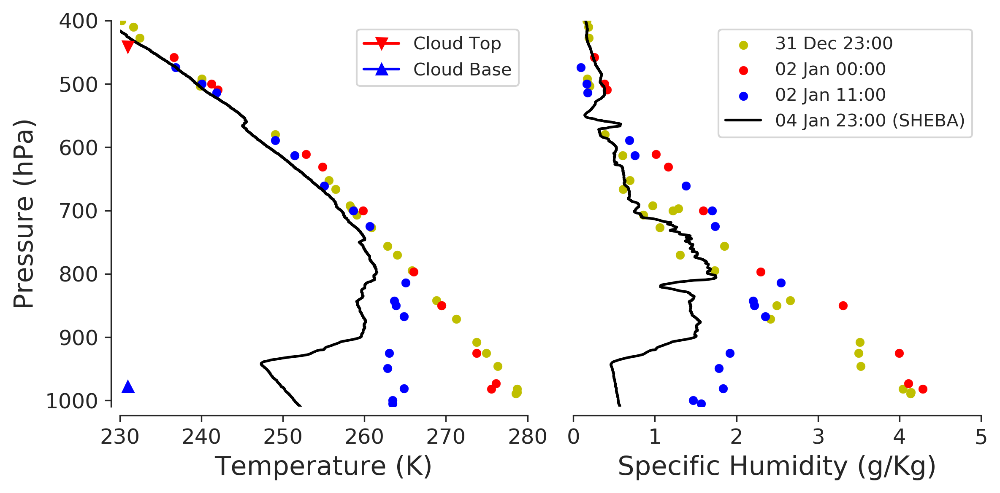

In [51]:
# improved plot for poster
fig = plt.figure(figsize=(8,4), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(1,2,1)


ax1.scatter(ukm3026.T, ukm3026.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(jnm1001.T, jnm1001.p,s =25, c='r', linewidths=0.1)
ax1.scatter(glm4320.T, glm4320.p,s =25, c='b', linewidths=0.1)
ax1.plot(she7.T, she7.p, c='k')

ax1.set_xlabel('Temperature (K)', fontsize=15)
ax1.set_ylabel('Pressure (hPa)', fontsize=15)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
# Plotting clouds
ax1.plot([231], [441.0], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [977.5], marker='^', label = 'Cloud Base', c='b')
ax1.tick_params(labelsize=12)
ax1.invert_yaxis()
ax1.set_ylim([1010,400])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)
plt.legend() 

ax2 = plt.subplot(1,2,2)

ax2.scatter(q_ukm3026, ukm3026.p, s=25, c='y', linewidths=0.1, label='31 Dec 23:00')
#ax2.scatter(q_fom6011, fom6011.p,s =25, c='r', linewidths=0.1, label='31 Dec-6011')
ax2.scatter(q_jnm1001, jnm1001.p,s =25, c='r', linewidths=0.1, label='02 Jan 00:00')
ax2.scatter(q_glm4320, glm4320.p,s =25, c='b', linewidths=0.1, label='02 Jan 11:00')
ax2.plot(q_she7, she7.p, 'k', label='04 Jan 23:00 (SHEBA)' )
ax2.tick_params(labelsize=12)
ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=15)

#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,3,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

# Plotting cloud top and cloud base


ax2.invert_yaxis()
ax2.set_ylim([1010,400])
ax2.set_xlim([0,5])
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)
plt.tight_layout()
sns.set_style("ticks")
#plt.suptitle('Evolution of air mass for the event 4 Jan 23:00', size = 16)

### Reproducing

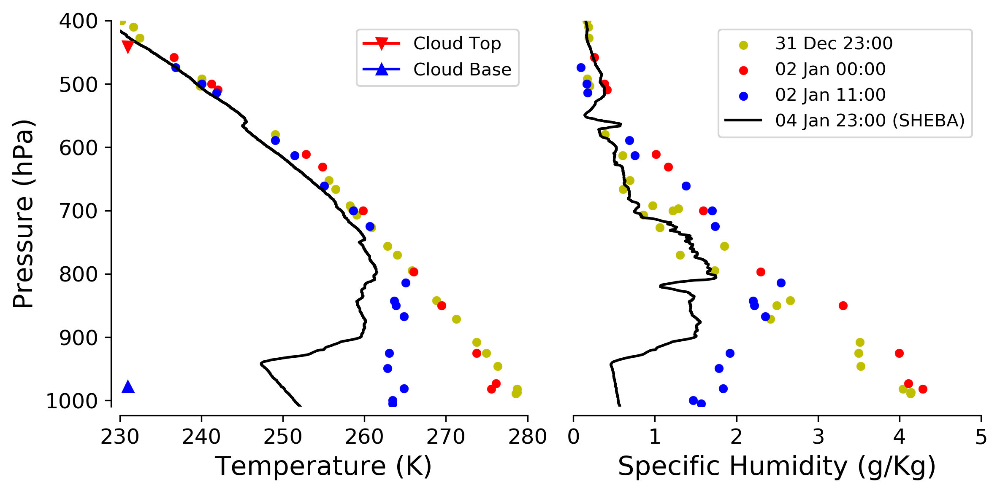

In [11]:
# improved plot for poster
fig = plt.figure(figsize=(8,4), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(1,2,1)


ax1.scatter(ukm3026.T, ukm3026.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(jnm1001.T, jnm1001.p,s =25, c='r', linewidths=0.1)
ax1.scatter(glm4320.T, glm4320.p,s =25, c='b', linewidths=0.1)
ax1.plot(she7.T, she7.p, c='k')

ax1.set_xlabel('Temperature (K)', fontsize=15)
ax1.set_ylabel('Pressure (hPa)', fontsize=15)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
# Plotting clouds
ax1.plot([231], [441.0], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [977.5], marker='^', label = 'Cloud Base', c='b')
ax1.tick_params(labelsize=12)
ax1.invert_yaxis()
ax1.set_ylim([1010,400])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)
plt.legend() 

ax2 = plt.subplot(1,2,2)

ax2.scatter(q_ukm3026, ukm3026.p, s=25, c='y', linewidths=0.1, label='31 Dec 23:00')
#ax2.scatter(q_fom6011, fom6011.p,s =25, c='r', linewidths=0.1, label='31 Dec-6011')
ax2.scatter(q_jnm1001, jnm1001.p,s =25, c='r', linewidths=0.1, label='02 Jan 00:00')
ax2.scatter(q_glm4320, glm4320.p,s =25, c='b', linewidths=0.1, label='02 Jan 11:00')
ax2.plot(q_she7, she7.p, 'k', label='04 Jan 23:00 (SHEBA)' )
ax2.tick_params(labelsize=12)
ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=15)

#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,3,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

# Plotting cloud top and cloud base


ax2.invert_yaxis()
ax2.set_ylim([1010,400])
ax2.set_xlim([0,5])
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)
plt.tight_layout()
sns.set_style("ticks")
#plt.suptitle('Evolution of air mass for the event 4 Jan 23:00', size = 16)

-----------------------------------------------------------------------------------------------------

# 10th Jan Cloudy

In [10]:
# sounding at sheba site
df5_sheba = sheba_df('/home/ollie/muali/data_work/Sounding_data/unzipped_data/1998_01_ascii/y1102340.she')
she5 = sd(df5_sheba)

In [11]:
q_she5 =  she5.spec_humidity()
rh_she5 =she5.relative_humidity()
rhi_she5 = she5.relative_humidity_ice()
pot_she5 = she5.potential_t()
tpw_she5 = she5.tpw(top= 500 * units.hectopascal)

/home/ollie/muali/python_notebook_ollie/sounding_df.py:64: RuntimeWarning: invalid value encountered in greater
  self.RH_w [self.RH_w > 120.] = 120 # assign RH = 100 for supersaturated values.
/work/ollie/muali/miniconda3/envs/myenv1/lib/python3.6/site-packages/pint/quantity.py:1070: RuntimeWarning: invalid value encountered in less
  return op(self._magnitude, other._magnitude)
/work/ollie/muali/miniconda3/envs/myenv1/lib/python3.6/site-packages/pint/quantity.py:1070: RuntimeWarning: invalid value encountered in greater
  return op(self._magnitude, other._magnitude)


In [12]:
#1998-01-06 15:00:00
# has 2 readings daily
# For 780 and 1000m
df_rsm23022 = sounding_finder(file='RSM00023022', from_line='#RSM00023022 1998 01 06 12',\
                           to_line='#RSM00023022 1998 01 07', to_df=1)
rsm23022 = sd(df_rsm23022)
q23022 = rsm23022.spec_humidity()
rh23022 = rsm23022.relative_humidity()
rhi23022 = rsm23022.relative_humidity_ice()
pot23022 = rsm23022.potential_t()
tpw23022 = rsm23022.tpw(top=500 *units.hectopascal)

In [13]:
# -95.2hour 1998-01-07 00:00:00 RSM00023205
# this station has 2 readings per day
df_23205 = sounding_finder(file='RSM00023205', from_line='#RSM00023205 1998 01 07',\
                           to_line='#RSM00023205 1998 01 07 12', to_df=1)
rsm23205 = sd(df_23205)
q23205 = rsm23205.spec_humidity()
rh23205 = rsm23205.relative_humidity()
rhi23205 = rsm23205.relative_humidity_ice()
pot23205 = rsm23205.potential_t()
tpw23205 = rsm23205.tpw(top=500 *units.hectopascal)
pot23205 = mcalc.potential_temperature(rsm23205.p *units.hectopascal, rsm23205.T *units.kelvin) # kelvin

In [14]:
import pandas as pd
rows = [x for x in range(0,25)]
file_ = '/home/ollie/muali/Data/alesund/NYA_UAS_1998.txt'
df_alesund = pd.read_csv(file_, sep='\t', skiprows=rows, index_col=0)
df_alesund.index = pd.to_datetime(df_alesund.index)
a = datetime(1998,10,8)
# 8th Jan 1998
df_ale8 = df_alesund.loc[(df_alesund.index.month==a.month) & (df_alesund.index.day==a.day),:].copy()
#7th Jan
b = datetime(1998,10,7)
df_ale7 = df_alesund.loc[(df_alesund.index.month==b.month) & (df_alesund.index.day==b.day),:].copy()

In [15]:
T_ale7 = df_ale7['TTT [°C]'].values + 273.15 # Kelvin # data for 7th needed
T_ale8 = df_ale8['TTT [°C]'].values + 273.15 # Kelvin
mr_7 = mcalc.mixing_ratio_from_relative_humidity(df_ale7['RH [%]'].values * units.percent, \
                                                 df_ale7['TTT [°C]'].values *units.celsius ,\
                                                 df_ale7['PPPP [hPa]'].values *units.hectopascal )
mr_8 = mcalc.mixing_ratio_from_relative_humidity(df_ale8['RH [%]'].values * units.percent, \
                                                 df_ale8['TTT [°C]'].values *units.celsius ,\
                                                 df_ale8['PPPP [hPa]'].values *units.hectopascal )
q_ale7 = mcalc.specific_humidity_from_mixing_ratio(mr_7) * 1000 # to change in g/Kg
q_ale8 = mcalc.specific_humidity_from_mixing_ratio(mr_8) * 1000

In [16]:
## On 7th Jan another trajectory passes through this station
# it belongs to Case 5, that is, 10th Jan 23:00 event
df_rsm22271_07 = sounding_finder(file='RSM00022271', from_line='#RSM00022271 1998 01 07 12',\
                           to_line='#RSM00022271 1998 01 08', to_df=1)
rsm22271_07 = sd(df_rsm22271_07)
q22271_07 = rsm22271_07.spec_humidity()
rh22271_07 = rsm22271_07.relative_humidity()

rhi22271_07 = rsm22271_07.relative_humidity_ice()
pot22271_07 = rsm22271_07.potential_t()
tpw22271_07 = rsm22271_07.tpw(top=500 *units.hectopascal)

## Single plot

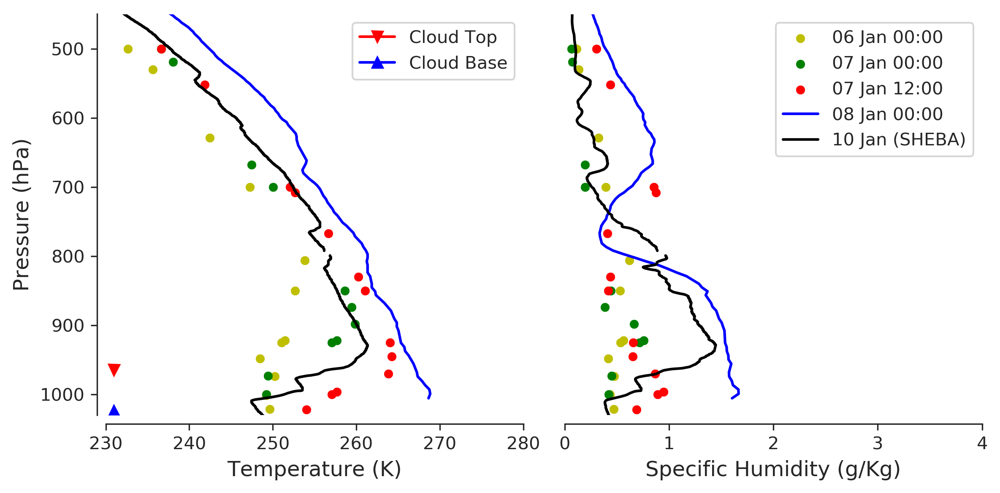

In [55]:
fig = plt.figure(figsize=(8,4), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(1,2,1) # (row,column,number)


ax1.scatter(rsm23022.T, rsm23022.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(rsm23205.T, rsm23205.p,s =25, c='g', linewidths=0.1)
ax1.scatter(rsm22271_07.T, rsm22271_07.p,s =25, c='r', linewidths=0.1)
ax1.plot(T_ale8, df_ale8['PPPP [hPa]'].values, c='b')
ax1.plot(she5.T, she5.p, c='k')

ax1.plot([231], [964.3], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [1024], marker='^', label = 'Cloud Base', c='b')
plt.legend()
ax1.set_xlabel('Temperature (K)', fontsize=12 )
ax1.set_ylabel('Pressure (hPa)', fontsize=12 )
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')


ax1.invert_yaxis()
ax1.set_ylim([1030,450])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)

ax2 = plt.subplot(1,2,2)

ax2.scatter(q23022, rsm23022.p, s=25, c='y', linewidths=0.1, label='06 Jan 00:00')

ax2.scatter(q23205, rsm23205.p,s =25, c='g', linewidths=0.1, label='07 Jan 00:00')
ax2.scatter(q22271_07, rsm22271_07.p,s =25, c='r', linewidths=0.1, label='07 Jan 12:00')
ax2.plot(q_ale8, df_ale8['PPPP [hPa]'].values , c='b', label='08 Jan 00:00')
ax2.plot(q_she5, she5.p, 'k', label='10 Jan (SHEBA)' )

ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=12)

 # setting legend

ax2.invert_yaxis()
ax2.set_ylim([1030,450])
ax2.set_xlim([0,4])
#plt.suptitle('Evolution of air mass for the event 10 Jan 23:00', size = 16)
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)
plt.tight_layout()
#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,3,4,0,1]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])


# 28 Jan

In [17]:
# sheba df 28th Jan 23:00
df_she_28_23 = sheba_df('/home/ollie/muali/data_work/Sounding_data/unzipped_data/1998_01_ascii/y1282329.she', dropnan=True)
she28_23 = sd(df_she_28_23)
q_she28_23 = she28_23.spec_humidity()
rh_she28_23 = she28_23.relative_humidity()
rhi_she28_23 = she28_23.relative_humidity_ice()
tpw_she28_23 = she28_23.tpw()
pot_she28_23 = she28_23.potential_t()

df_cam71043_27_00 = sounding_finder(file='CAM00071043', from_line='#CAM00071043 1998 01 27 00',\
                           to_line='#CAM00071043 1998 01 27 12', to_df=1)

df_cam71043_27_12 = sounding_finder(file='CAM00071043', from_line='#CAM00071043 1998 01 27 12',\
                           to_line='#CAM00071043 1998 01 28', to_df=1)

df_cam71043_28_00 = sounding_finder(file='CAM00071043', from_line='#CAM00071043 1998 01 28 00',\
                           to_line='#CAM00071043 1998 01 28 12', to_df=1)

cam71043_27_00 = sd(df_cam71043_27_00)
cam71043_27_12 = sd(df_cam71043_27_12)
cam71043_28_00 = sd(df_cam71043_28_00)

q_cam71043_27_00 = cam71043_27_00.spec_humidity()
rh_cam71043_27_00 = cam71043_27_00.relative_humidity()
rhi_cam71043_27_00 = cam71043_27_00.relative_humidity_ice()
pot_cam71043_27_00 = cam71043_27_00.potential_t()
tpw_cam71043_27_00 = cam71043_27_00.tpw(top= 500*units.hectopascal)

q_cam71043_27_12 = cam71043_27_12.spec_humidity()
rh_cam71043_27_12 = cam71043_27_12.relative_humidity()
rhi_cam71043_27_12 = cam71043_27_12.relative_humidity_ice()
pot_cam71043_27_12 = cam71043_27_12.potential_t()
tpw_cam71043_27_12 = cam71043_27_12.tpw(top= 500*units.hectopascal)

q_cam71043_28_00 = cam71043_28_00.spec_humidity()
rh_cam71043_28_00 = cam71043_28_00.relative_humidity()
rhi_cam71043_28_00 = cam71043_28_00.relative_humidity_ice()
pot_cam71043_28_00 = cam71043_28_00.potential_t()
tpw_cam71043_28_00 = cam71043_28_00.tpw(top= 500*units.hectopascal)

df_cam71957 = sounding_finder(file='CAM00071957', from_line='#CAM00071957 1998 01 27 12',\
                           to_line='#CAM00071957 1998 01 28', to_df=1)

df_cam71957_28_00 = sounding_finder(file='CAM00071957', from_line='#CAM00071957 1998 01 28 00',\
                           to_line='#CAM00071957 1998 01 28 12', to_df=1)

cam71957 = sd(df_cam71957)

cam71957_28_00 = sd(df_cam71957_28_00)

q_cam71957_28_00 = cam71957_28_00.spec_humidity()
rh_cam71957_28_00 = cam71957_28_00.relative_humidity()
rhi_cam71957_28_00 = cam71957_28_00.relative_humidity_ice()
pot_cam71957_28_00 = cam71957_28_00.potential_t()
tpw_cam71957_28_00 = cam71957_28_00.tpw(top= 500*units.hectopascal)

q_cam71957 = cam71957.spec_humidity()
rh_cam71957 = cam71957.relative_humidity()
rhi_cam71957 = cam71957.relative_humidity_ice()
pot_cam71957 = cam71957.potential_t()
tpw_cam71957 = cam71957.tpw(top= 500*units.hectopascal)


## joint plot - all cloudy

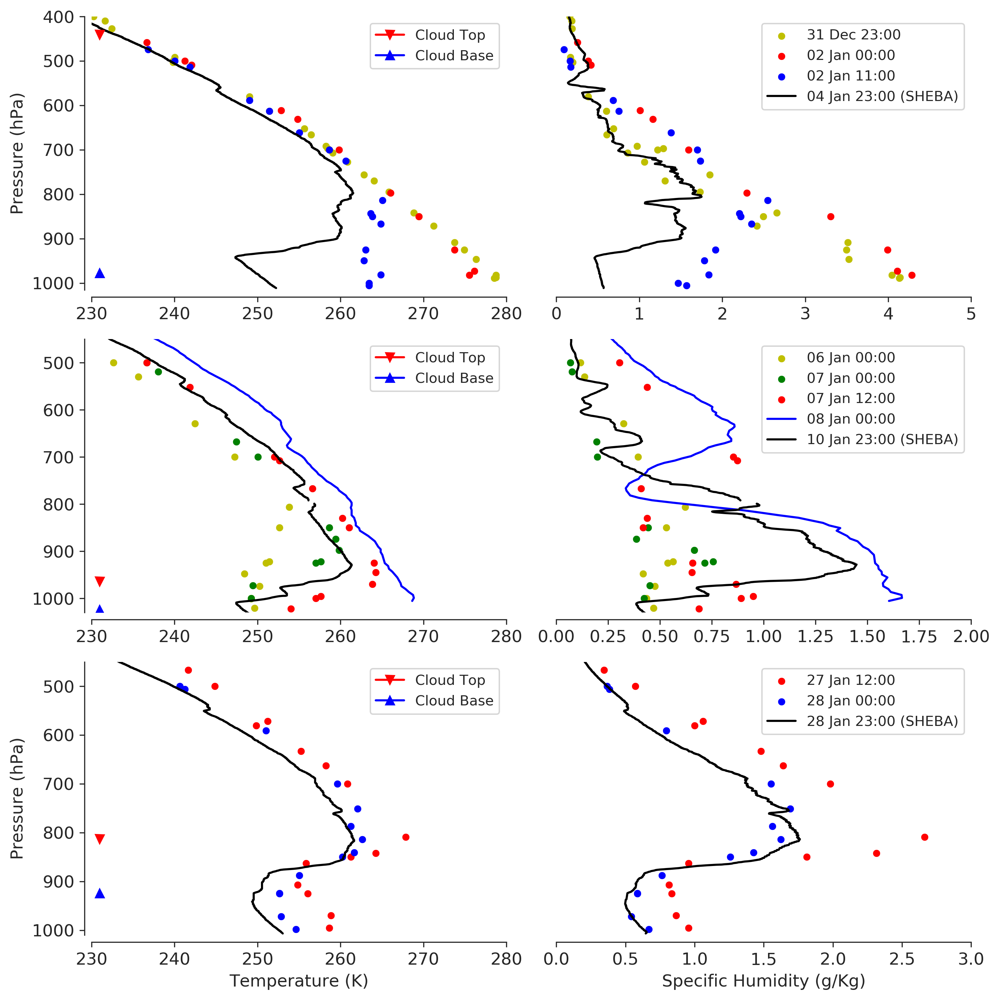

In [81]:
# joint plot
fig = plt.figure(figsize=(10,10), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(3,2,1)


ax1.scatter(ukm3026.T, ukm3026.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(jnm1001.T, jnm1001.p,s =25, c='r', linewidths=0.1)
ax1.scatter(glm4320.T, glm4320.p,s =25, c='b', linewidths=0.1)
ax1.plot(she7.T, she7.p, c='k')

#ax1.set_xlabel('Temperature (K)', fontsize=15)
ax1.set_ylabel('Pressure (hPa)', fontsize=12)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
# Plotting clouds
ax1.plot([231], [441.0], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [977.5], marker='^', label = 'Cloud Base', c='b')
ax1.tick_params(labelsize=12)
ax1.invert_yaxis()
ax1.set_ylim([1015,400])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)
plt.legend() 

ax2 = plt.subplot(3,2,2)

ax2.scatter(q_ukm3026, ukm3026.p, s=25, c='y', linewidths=0.1, label='31 Dec 23:00')
#ax2.scatter(q_fom6011, fom6011.p,s =25, c='r', linewidths=0.1, label='31 Dec-6011')
ax2.scatter(q_jnm1001, jnm1001.p,s =25, c='r', linewidths=0.1, label='02 Jan 00:00')
ax2.scatter(q_glm4320, glm4320.p,s =25, c='b', linewidths=0.1, label='02 Jan 11:00')
ax2.plot(q_she7, she7.p, 'k', label='04 Jan 23:00 (SHEBA)' )
ax2.tick_params(labelsize=12)
#ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=15)

#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,3,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

# Plotting cloud top and cloud base


ax2.invert_yaxis()
ax2.set_ylim([1015,400])
ax2.set_xlim([0,5])
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)
plt.tight_layout()
sns.set_style("ticks")
#plt.suptitle('Evolution of air mass for the event 4 Jan 23:00', size = 16)

###########
###########


ax3 = plt.subplot(3,2,3) # (row,column,number)


ax3.scatter(rsm23022.T, rsm23022.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax3.scatter(rsm23205.T, rsm23205.p,s =25, c='g', linewidths=0.1)
ax3.scatter(rsm22271_07.T, rsm22271_07.p,s =25, c='r', linewidths=0.1)
ax3.plot(T_ale8, df_ale8['PPPP [hPa]'].values, c='b')
ax3.plot(she5.T, she5.p, c='k')

ax3.plot([231], [964.3], marker='v', label = 'Cloud Top', c='r')
ax3.plot([231], [1024], marker='^', label = 'Cloud Base', c='b')
ax3.tick_params(labelsize=12)
plt.legend()
#ax3.set_xlabel('Temperature (K)', fontsize=12 )
#ax3.set_ylabel('Pressure (hPa)', fontsize=12 )
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')


ax3.invert_yaxis()
ax3.set_ylim([1030,450])
ax3.set_xlim([230, 280])
sns.despine(ax=ax3, offset=5)

ax4 = plt.subplot(3,2,4)

ax4.scatter(q23022, rsm23022.p, s=25, c='y', linewidths=0.1, label='06 Jan 00:00')

ax4.scatter(q23205, rsm23205.p,s =25, c='g', linewidths=0.1, label='07 Jan 00:00')
ax4.scatter(q22271_07, rsm22271_07.p,s =25, c='r', linewidths=0.1, label='07 Jan 12:00')
ax4.plot(q_ale8, df_ale8['PPPP [hPa]'].values , c='b', label='08 Jan 00:00')
ax4.plot(q_she5, she5.p, 'k', label='10 Jan 23:00 (SHEBA)' )

ax4.set_xlabel('', fontsize=1)

 # setting legend

ax4.invert_yaxis()
ax4.set_ylim([1030,450])
ax4.set_xlim([0,2])
#plt.suptitle('Evolution of air mass for the event 10 Jan 23:00', size = 16)
ax4.set_yticklabels([])
ax4.set_yticks([])
ax4.tick_params(labelsize=12)
sns.despine(ax=ax4, left=True, offset=5)
plt.tight_layout()
#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,3,4,0,1]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

##################################################################################################################

ax5 = plt.subplot(3,2,5) # (row,column,number)


ax5.scatter(cam71043_27_12.T, cam71043_27_12.p,s =25, c='r', linewidths=0.1)
ax5.scatter(cam71957_28_00.T, cam71957_28_00.p,s =25, c='b', linewidths=0.1)

ax5.plot(she28_23.T, she28_23.p, c='k' )
ax5.tick_params(labelsize=12)
ax5.plot([231], [813.0], marker='v', label = 'Cloud Top', c='r')
ax5.plot([231], [924.5], marker='^', label = 'Cloud Base', c='b')

ax5.set_xlabel('Temperature (K)', fontsize=12)
ax5.set_ylabel('Pressure (hPa)', fontsize=12)
ax5.invert_yaxis()
ax5.set_ylim([1010,450])
ax5.set_xlim([230, 280])
sns.despine(ax=ax5, offset=5)
plt.legend()

ax6 = plt.subplot(3,2,6)



ax6.scatter(q_cam71957_28_00,  cam71957_28_00.p, s=25,  c='b', linewidths=0.1, label='28 Jan 00:00')
ax6.plot(q_she28_23, she28_23.p, 'k', label='28 Jan 23:00 (SHEBA)' )
ax6.scatter(q_cam71043_27_12, cam71043_27_12.p,s =25, c='r', linewidths=0.1, label='27 Jan 12:00')
ax6.tick_params(labelsize=12)
ax6.set_xlabel('Specific Humidity (g/Kg)', fontsize=12)

plt.legend() # setting legend

ax6.invert_yaxis()
ax6.set_ylim([1010,450])
ax6.set_xlim([0,3])
# plt.suptitle('Evolution of air mass for the event 28 Jan 23:00', size = 16)
ax6.set_yticklabels([])
ax6.set_yticks([])
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,1,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])
sns.despine(ax=ax6, left=True, offset=5)
plt.tight_layout()


# Ploting all profiles (Paper)

## 12 January Clear State

In [18]:
# sheba df 12th Jan 11:00
df_she12 = sheba_df('/home/ollie/muali/data_work/Sounding_data/unzipped_data/1998_01_ascii/y1121115.she', dropnan=True)
she12 = sd(df_she12)
q_she12 = she12.spec_humidity()
rh_she12 = she12.relative_humidity()
rhi_she12 = she12.relative_humidity_ice()
tpw_she12 = she12.tpw()
pot_she12 = she12.potential_t()

#RSM00021824

df_RSM00021824_00 = sounding_finder(file='RSM00021824', from_line='#RSM00021824 1998 01 09 00',\
                           to_line='#RSM00021824 1998 01 09 12', to_df=1)

df_RSM00021824_12 = sounding_finder(file='RSM00021824', from_line='#RSM00021824 1998 01 09 12',\
                           to_line='#RSM00021824 1998 01 10', to_df=1)

RSM00021824_00 = sd(df_RSM00021824_00)
q_RSM00021824_00 = RSM00021824_00.spec_humidity()
rh_RSM00021824_00 = RSM00021824_00.relative_humidity()
rhi_RSM00021824_00 = RSM00021824_00.relative_humidity_ice()
tpw_RSM00021824_00 = RSM00021824_00.tpw()
pot_RSM00021824_00 = RSM00021824_00.potential_t()
RSM00021824_12 = sd(df_RSM00021824_12)
q_RSM00021824_12 = RSM00021824_12.spec_humidity()
rh_RSM00021824_12 = RSM00021824_12.relative_humidity()
rhi_RSM00021824_12 = RSM00021824_12.relative_humidity_ice()
tpw_RSM00021824_12 = RSM00021824_12.tpw()
pot_RSM00021824_12 = RSM00021824_12.potential_t()

# RSM00021946
df_rsm21946_00, header_rsm21946_00 = IGRAUpperAir.request_data(datetime(1998,1,9,0), 'RSM00021946',derived=True)
q_rsm21946_00 = mcalc.specific_humidity_from_mixing_ratio(mcalc.mixing_ratio_from_relative_humidity\
                                          (df_rsm21946_00['calculated_relative_humidity'].values * units.percent, \
                                           df_rsm21946_00['temperature'].values * units.kelvin,\
                                          df_rsm21946_00['pressure'].values * units.hectopascal))

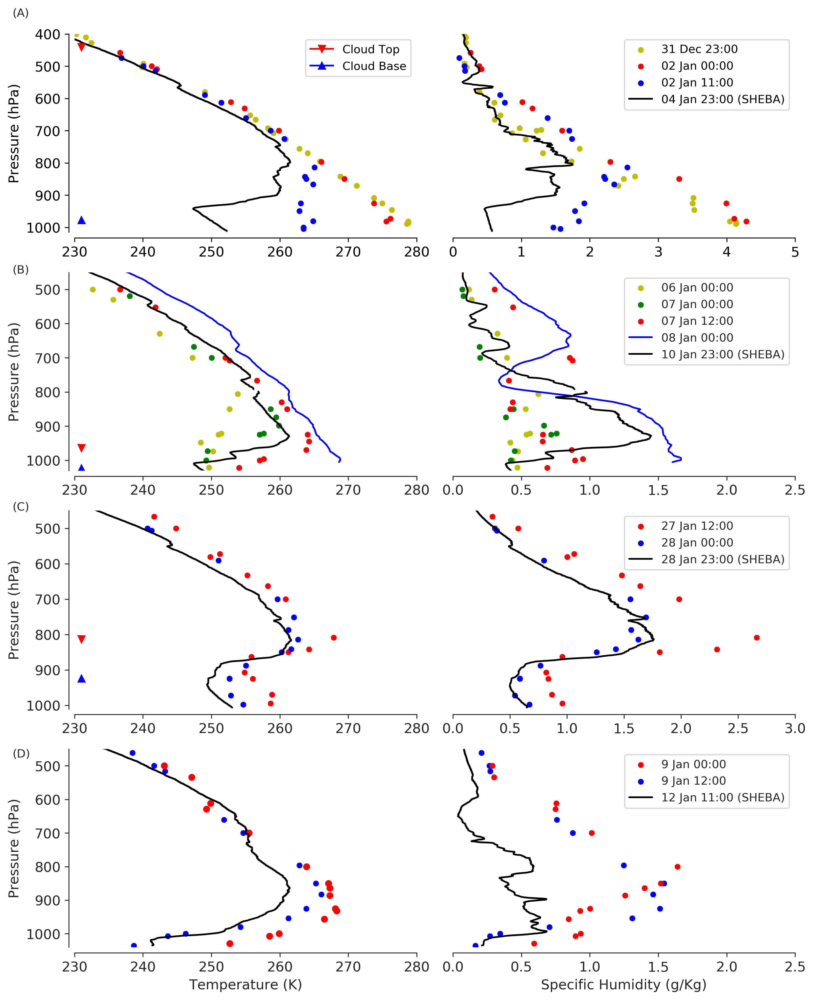

In [19]:
# joint plot
fig = plt.figure(figsize=(10,12), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(4,2,1)


ax1.scatter(ukm3026.T, ukm3026.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(jnm1001.T, jnm1001.p,s =25, c='r', linewidths=0.1)
ax1.scatter(glm4320.T, glm4320.p,s =25, c='b', linewidths=0.1)
ax1.plot(she7.T, she7.p, c='k')

#ax1.set_xlabel('Temperature (K)', fontsize=15)
ax1.set_ylabel('Pressure (hPa)', fontsize=12)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
# Plotting clouds
ax1.plot([231], [441.0], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [977.5], marker='^', label = 'Cloud Base', c='b')
ax1.tick_params(labelsize=12)
ax1.invert_yaxis()
ax1.set_ylim([1015,400])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)
plt.legend() 

ax2 = plt.subplot(4,2,2)

ax2.scatter(q_ukm3026, ukm3026.p, s=25, c='y', linewidths=0.1, label='31 Dec 23:00')
#ax2.scatter(q_fom6011, fom6011.p,s =25, c='r', linewidths=0.1, label='31 Dec-6011')
ax2.scatter(q_jnm1001, jnm1001.p,s =25, c='r', linewidths=0.1, label='02 Jan 00:00')
ax2.scatter(q_glm4320, glm4320.p,s =25, c='b', linewidths=0.1, label='02 Jan 11:00')
ax2.plot(q_she7, she7.p, 'k', label='04 Jan 23:00 (SHEBA)' )
ax2.tick_params(labelsize=12)
#ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=15)

#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,3,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

# Plotting cloud top and cloud base


ax2.invert_yaxis()
ax2.set_ylim([1015,400])
ax2.set_xlim([0,5])
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)

sns.set_style("ticks")
#plt.suptitle('Evolution of air mass for the event 4 Jan 23:00', size = 16)

###########
###########


ax3 = plt.subplot(4,2,3) # (row,column,number)


ax3.scatter(rsm23022.T, rsm23022.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax3.scatter(rsm23205.T, rsm23205.p,s =25, c='g', linewidths=0.1)
ax3.scatter(rsm22271_07.T, rsm22271_07.p,s =25, c='r', linewidths=0.1)
ax3.plot(T_ale8, df_ale8['PPPP [hPa]'].values, c='b')
ax3.plot(she5.T, she5.p, c='k')

ax3.plot([231], [964.3], marker='v', label = 'Cloud Top', c='r')
ax3.plot([231], [1024], marker='^', label = 'Cloud Base', c='b')
ax3.tick_params(labelsize=12)
#plt.legend()
#ax3.set_xlabel('Temperature (K)', fontsize=12 )
ax3.set_ylabel('Pressure (hPa)', fontsize=12 )
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')


ax3.invert_yaxis()
ax3.set_ylim([1030,450])
ax3.set_xlim([230, 280])
sns.despine(ax=ax3, offset=5)

ax4 = plt.subplot(4,2,4)

ax4.scatter(q23022, rsm23022.p, s=25, c='y', linewidths=0.1, label='06 Jan 00:00')

ax4.scatter(q23205, rsm23205.p,s =25, c='g', linewidths=0.1, label='07 Jan 00:00')
ax4.scatter(q22271_07, rsm22271_07.p,s =25, c='r', linewidths=0.1, label='07 Jan 12:00')
ax4.plot(q_ale8, df_ale8['PPPP [hPa]'].values , c='b', label='08 Jan 00:00')
ax4.plot(q_she5, she5.p, 'k', label='10 Jan 23:00 (SHEBA)' )

ax4.set_xlabel('', fontsize=1)

 # setting legend

ax4.invert_yaxis()
ax4.set_ylim([1030,450])
ax4.set_xlim([0,2.5])
#plt.suptitle('Evolution of air mass for the event 10 Jan 23:00', size = 16)
ax4.set_yticklabels([])
ax4.set_yticks([])
ax4.tick_params(labelsize=12)
sns.despine(ax=ax4, left=True, offset=5)
#plt.tight_layout()
#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,3,4,0,1]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

##################################################################################################################

ax5 = plt.subplot(4,2,5) # (row,column,number)


ax5.scatter(cam71043_27_12.T, cam71043_27_12.p,s =25, c='r', linewidths=0.1)
ax5.scatter(cam71957_28_00.T, cam71957_28_00.p,s =25, c='b', linewidths=0.1)

ax5.plot(she28_23.T, she28_23.p, c='k' )
ax5.tick_params(labelsize=12)
ax5.plot([231], [813.0], marker='v', label = 'Cloud Top', c='r')
ax5.plot([231], [924.5], marker='^', label = 'Cloud Base', c='b')

#ax5.set_xlabel('Temperature (K)', fontsize=12)
ax5.set_ylabel('Pressure (hPa)', fontsize=12)
ax5.invert_yaxis()
ax5.set_ylim([1010,450])
ax5.set_xlim([230, 280])
sns.despine(ax=ax5, offset=5)
#plt.legend()

ax6 = plt.subplot(4,2,6)



ax6.scatter(q_cam71957_28_00,  cam71957_28_00.p, s=25,  c='b', linewidths=0.1, label='28 Jan 00:00')
ax6.plot(q_she28_23, she28_23.p, 'k', label='28 Jan 23:00 (SHEBA)' )
ax6.scatter(q_cam71043_27_12, cam71043_27_12.p,s =25, c='r', linewidths=0.1, label='27 Jan 12:00')
ax6.tick_params(labelsize=12)
#ax6.set_xlabel('Specific Humidity (g/Kg)', fontsize=12)

plt.legend() # setting legend

ax6.invert_yaxis()
ax6.set_ylim([1010,450])
ax6.set_xlim([0,3])
# plt.suptitle('Evolution of air mass for the event 28 Jan 23:00', size = 16)
ax6.set_yticklabels([])
ax6.set_yticks([])
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,1,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])
sns.despine(ax=ax6, left=True, offset=5)



#################################################################################
#################################################################################

ax7 = plt.subplot(4,2,7)
ax7.scatter(RSM00021824_12.T, RSM00021824_12.p, s =25, c='b', linewidths=0.1)
ax7.scatter(df_rsm21946_00['temperature'], df_rsm21946_00['pressure'], s=25, c='r')

ax7.plot(she12.T, she12.p, c='k', label='SHEBA' )
ax7.tick_params(labelsize=12)
ax7.set_xlabel('Temperature (K)', fontsize=12)
ax7.set_ylabel('Pressure (hPa)', fontsize=12)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
#plt.legend() # setting legend

ax7.invert_yaxis()
ax7.set_ylim([1040,450])
ax7.set_xlim([230, 280])
sns.despine(ax=ax7, offset=5)
ax8 = plt.subplot(4,2,8)


ax8.scatter(q_RSM00021824_12, RSM00021824_12.p, s =25, c='b', linewidths=0.1, label='9 Jan 12:00')
ax8.scatter(q_rsm21946_00*1000, df_rsm21946_00['pressure'], s=25, linewidths=0.1, c ='r', label='9 Jan 00:00')

ax8.plot(q_she12, she12.p, 'k', label='12 Jan 11:00 (SHEBA)' )

ax8.set_xlabel('Specific Humidity (g/Kg)', fontsize=12)

ax8.tick_params(labelsize=12)
plt.legend() # setting legend

ax8.invert_yaxis()
ax8.set_ylim([1040,450])
ax8.set_xlim([0,2.5])


ax8.set_yticklabels([])
ax8.set_yticks([])
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,1,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])
sns.despine(ax=ax8, left=True, offset=5)


plt.figtext(x=0.02, y=1, s='(A)');
plt.figtext(x=0.02, y=0.74, s='(B)');
plt.figtext(x=0.02, y=0.5, s='(C)');
plt.figtext(x=0.02, y=0.25, s='(D)');
plt.tight_layout()

# Plotting 4 Jan, 10 Jan

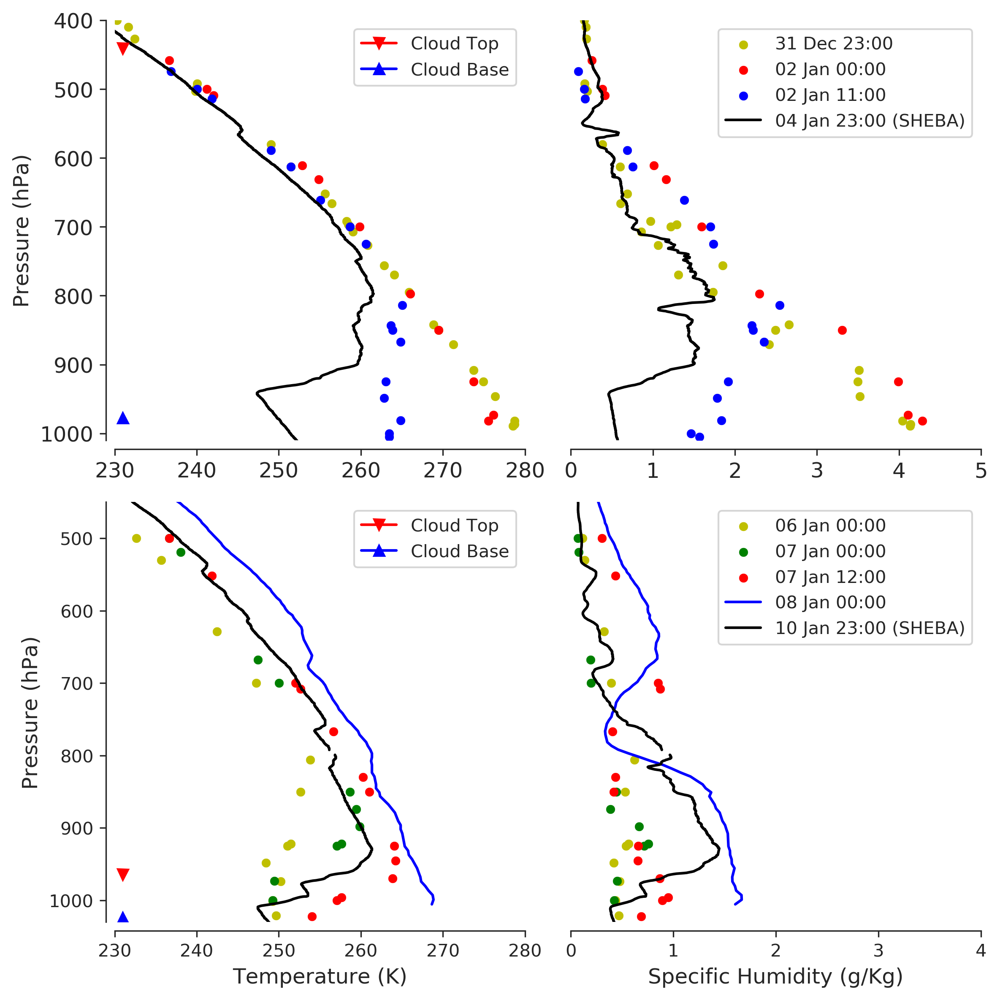

In [59]:

fig = plt.figure(figsize=(8,8), dpi=300)
#ax = plt.subplots()

ax1 = plt.subplot(2,2,1)


ax1.scatter(ukm3026.T, ukm3026.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax1.scatter(jnm1001.T, jnm1001.p,s =25, c='r', linewidths=0.1)
ax1.scatter(glm4320.T, glm4320.p,s =25, c='b', linewidths=0.1)
ax1.plot(she7.T, she7.p, c='k')

#ax1.set_xlabel('Temperature (K)', fontsize=15)
ax1.set_ylabel('Pressure (hPa)', fontsize=12)
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')
# Plotting clouds
ax1.plot([231], [441.0], marker='v', label = 'Cloud Top', c='r')
ax1.plot([231], [977.5], marker='^', label = 'Cloud Base', c='b')
ax1.tick_params(labelsize=12)
ax1.invert_yaxis()
ax1.set_ylim([1010,400])
ax1.set_xlim([230, 280])
sns.despine(ax=ax1, offset=5)
plt.legend() 

ax2 = plt.subplot(2,2,2)

ax2.scatter(q_ukm3026, ukm3026.p, s=25, c='y', linewidths=0.1, label='31 Dec 23:00')
#ax2.scatter(q_fom6011, fom6011.p,s =25, c='r', linewidths=0.1, label='31 Dec-6011')
ax2.scatter(q_jnm1001, jnm1001.p,s =25, c='r', linewidths=0.1, label='02 Jan 00:00')
ax2.scatter(q_glm4320, glm4320.p,s =25, c='b', linewidths=0.1, label='02 Jan 11:00')
ax2.plot(q_she7, she7.p, 'k', label='04 Jan 23:00 (SHEBA)' )
ax2.tick_params(labelsize=12)
#ax2.set_xlabel('Specific Humidity (g/Kg)', fontsize=15)

#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [1,2,3,0]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])

# Plotting cloud top and cloud base


ax2.invert_yaxis()
ax2.set_ylim([1010,400])
ax2.set_xlim([0,5])
ax2.set_yticklabels([])
ax2.set_yticks([])
sns.despine(ax=ax2, left=True, offset=5)
plt.tight_layout()
sns.set_style("ticks")
#plt.suptitle('Evolution of air mass for the event 4 Jan 23:00', size = 16)

###########
###########


ax3 = plt.subplot(2,2,3) # (row,column,number)


ax3.scatter(rsm23022.T, rsm23022.p,s =25, c='y', linewidths=0.1)
#ax1.scatter(fom6011.temp, fom6011.p,s =25, c='r', linewidths=0.1)
ax3.scatter(rsm23205.T, rsm23205.p,s =25, c='g', linewidths=0.1)
ax3.scatter(rsm22271_07.T, rsm22271_07.p,s =25, c='r', linewidths=0.1)
ax3.plot(T_ale8, df_ale8['PPPP [hPa]'].values, c='b')
ax3.plot(she5.T, she5.p, c='k')

ax3.plot([231], [964.3], marker='v', label = 'Cloud Top', c='r')
ax3.plot([231], [1024], marker='^', label = 'Cloud Base', c='b')
plt.legend()
ax3.set_xlabel('Temperature (K)', fontsize=12 )
ax3.set_ylabel('Pressure (hPa)', fontsize=12 )
#ax1.set_title('Evolution of air mass for event 4 Jan 23:00')


ax3.invert_yaxis()
ax3.set_ylim([1030,450])
ax3.set_xlim([230, 280])
sns.despine(ax=ax3, offset=5)

ax4 = plt.subplot(2,2,4)

ax4.scatter(q23022, rsm23022.p, s=25, c='y', linewidths=0.1, label='06 Jan 00:00')

ax4.scatter(q23205, rsm23205.p,s =25, c='g', linewidths=0.1, label='07 Jan 00:00')
ax4.scatter(q22271_07, rsm22271_07.p,s =25, c='r', linewidths=0.1, label='07 Jan 12:00')
ax4.plot(q_ale8, df_ale8['PPPP [hPa]'].values , c='b', label='08 Jan 00:00')
ax4.plot(q_she5, she5.p, 'k', label='10 Jan 23:00 (SHEBA)' )

ax4.set_xlabel('Specific Humidity (g/Kg)', fontsize=12)

 # setting legend

ax4.invert_yaxis()
ax4.set_ylim([1030,450])
ax4.set_xlim([0,4])
#plt.suptitle('Evolution of air mass for the event 10 Jan 23:00', size = 16)
ax4.set_yticklabels([])
ax4.set_yticks([])
sns.despine(ax=ax4, left=True, offset=5)
plt.tight_layout()
#ordering labels
handles, labels = plt.gca().get_legend_handles_labels()
order = [2,3,4,0,1]
plt.legend([handles[idx] for idx in order],[labels[idx] for idx in order])



# Plotting Trajectories

## Jan 4

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

from netCDF4 import Dataset
from netCDF4 import date2index
from datetime import datetime


def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    #m.drawcoastlines(color='0.75')
    m.fillcontinents(color='0.75')
    m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
    st_lat = [58.217, 70.939, 76.7689  ] #ukm3026, jnm1001, glm 4320
    st_lon = [-6.317, -8.667, -18.668]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

In [ ]:
## Joint plot

    # creating a basemap
fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
#m.drawcoastlines(color='0.75')
m.fillcontinents(color='0.75')
#m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
# Reading Sea Ice data
filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
timeindex = date2index(datetime(1998,1,15),ds.variables['time'])
lats_ice = ds.variables['latitude'][:]
lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
ds.close()
        
        # plotting Sea Ice
m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
plt.clim(0, 100) # Set the color limits of the current image
plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
    st_lat = [58.217, 70.939, 76.7689  ] #ukm3026, jnm1001, glm 4320
    st_lon = [-6.317, -8.667, -18.668]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

In [3]:
# path to all trajectory files
path_traj= '/home/ollie/muali/Data/winter_all/'

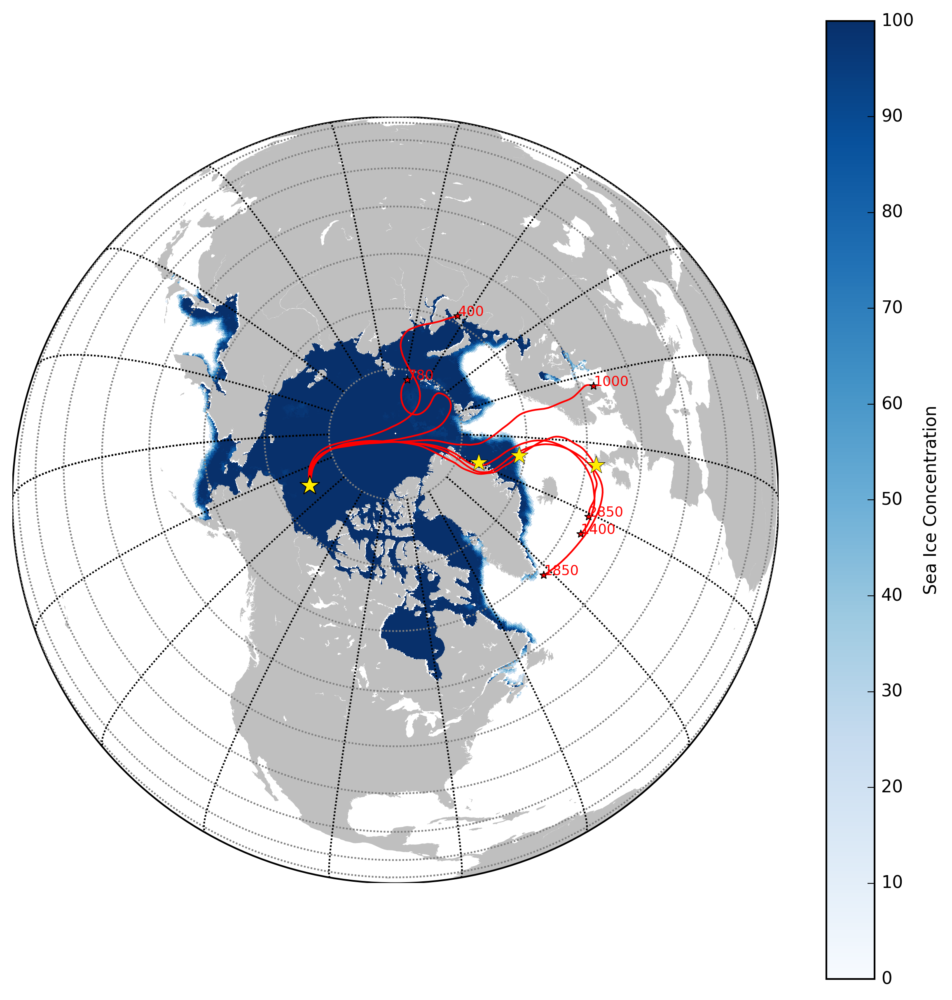

In [6]:
traj_plot(datetime(1998,1,4,23), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

## Jan 10, 23:00

In [3]:
def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    #m.drawcoastlines(color='0.75')
    m.fillcontinents(color='0.75')
    m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
st_lat = [69.78, 67.625, 67.876, 78.92, 68.983] #ukm3026, jnm1001, glm 4320
st_lon = [61.783, 53.02, 44.17, 11.92, 33.12]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

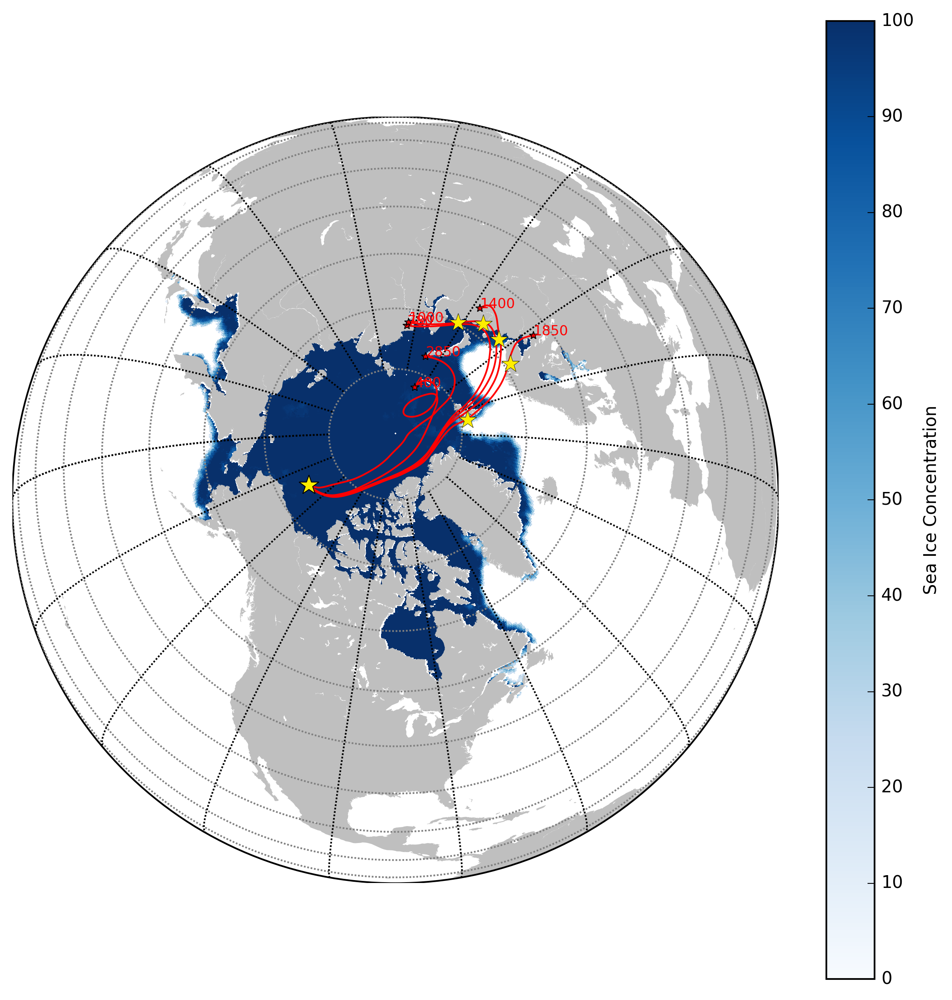

In [6]:
traj_plot(datetime(1998,1,10,23), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

## Jan 28, 23:00

In [5]:
def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    #m.drawcoastlines(color='0.75')
    m.fillcontinents(color='0.75')
    m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
    st_lat = [65.28, 68.316  ] #ukm3026, jnm1001, glm 4320
    st_lon = [-126.75, -133.516]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

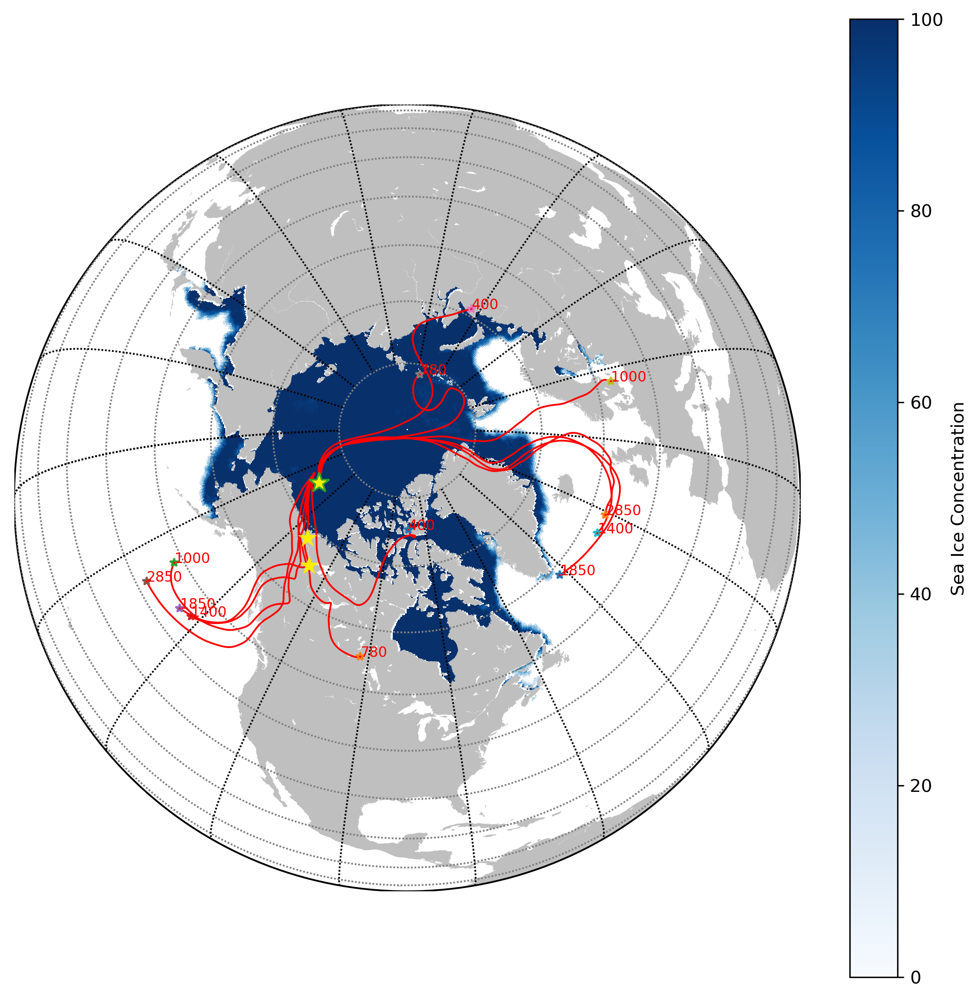

In [8]:
traj_plot(datetime(1998,1,28,23), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

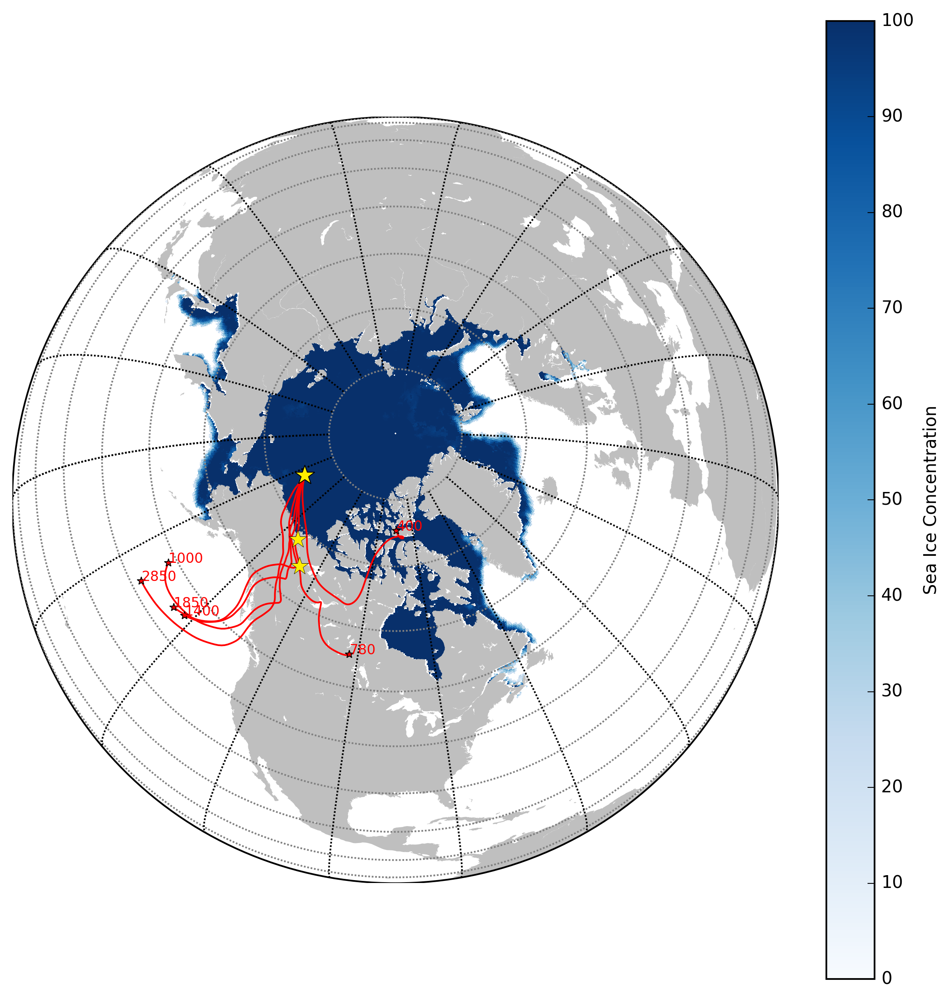

In [8]:
traj_plot(datetime(1998,1,28,23), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

## 7 Dec 11:00

In [13]:
def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    #m.drawcoastlines(color='0.75')
    m.fillcontinents(color='0.75')
    m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
    st_lat = [68.316 , 47.933] #ukm3026, jnm1001, glm 4320
    st_lon = [-133.516, -124.56]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

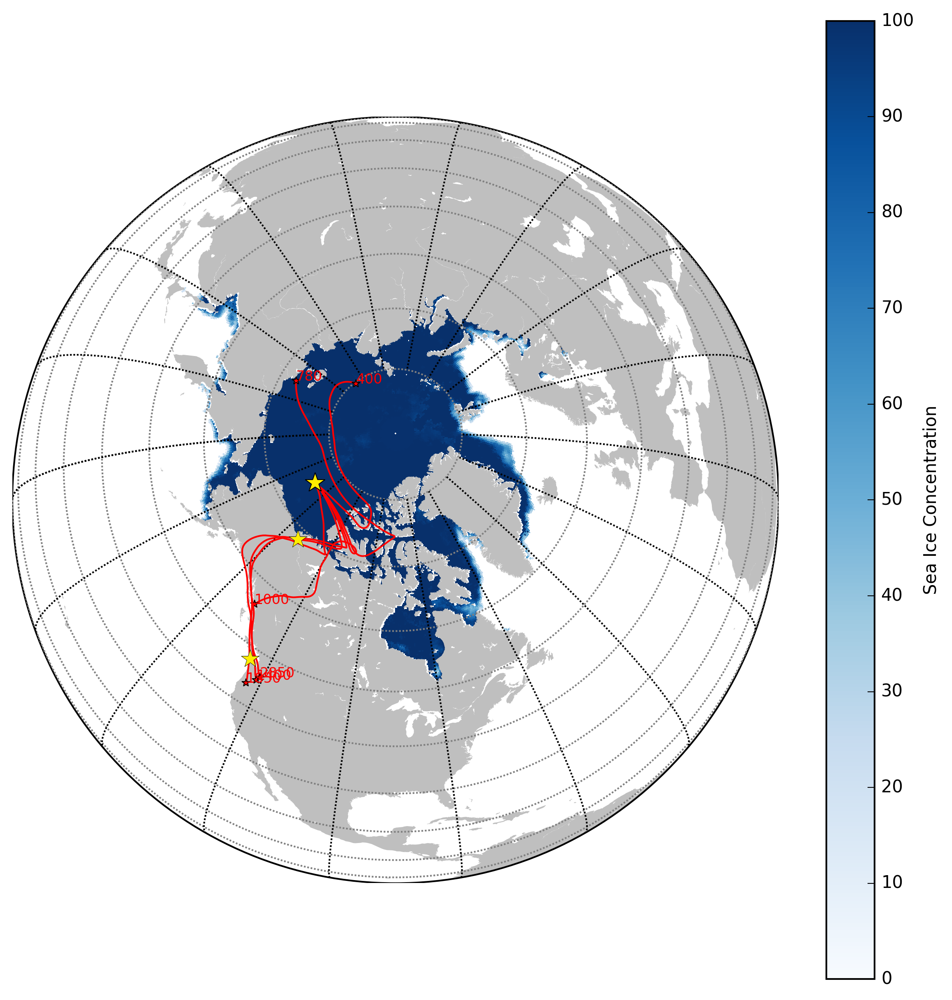

In [14]:
traj_plot(datetime(1997,12,7,11), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

## 26 Feb

In [4]:
def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
        
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    #m.drawcoastlines(color='0.75')
    m.fillcontinents(color='0.75')
    m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration')
    
    
    
    all_dates = "" # to print dates in the title
    
    for d_ in date_str:
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color='red')
        
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
            plt.plot(xpt, ypt, marker = '*', markerfacecolor='red', linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color='red')
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.plot(x_s, y_s, marker = '*', markerfacecolor='#ffed00', linewidth=0, markersize=12)
    
        # plotting only relevant stations
    st_lat = [60.732, 68.316] #ukm3026, jnm1001, glm 4320
    st_lon = [-135.096, -133.516]
    
    st_x, st_y = m(st_lon, st_lat)
    m.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, linewidth=0.2, zorder=10)
    
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
    if stations is not None:
        # plotting stations
        # Reading IGRA list
        df_IGRA = pd.read_excel('/home/ollie/muali/python_notebook_ollie/IGR_Above_25Lat.xlsx')
        df_IGRA2 = df_IGRA.loc[df_IGRA['Lat'] > 55.]
        station_lat = df_IGRA2['Lat'].values
        station_lon = df_IGRA2['Lon'].values
        station_x, station_y = m(station_lon, station_lat)
        m.scatter(station_x, station_y, marker = '*', c='#ffed00', s=45, linewidth=0.2, zorder=10)
        ##FFED00 yellow #00ff19: greenish color'
    
    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

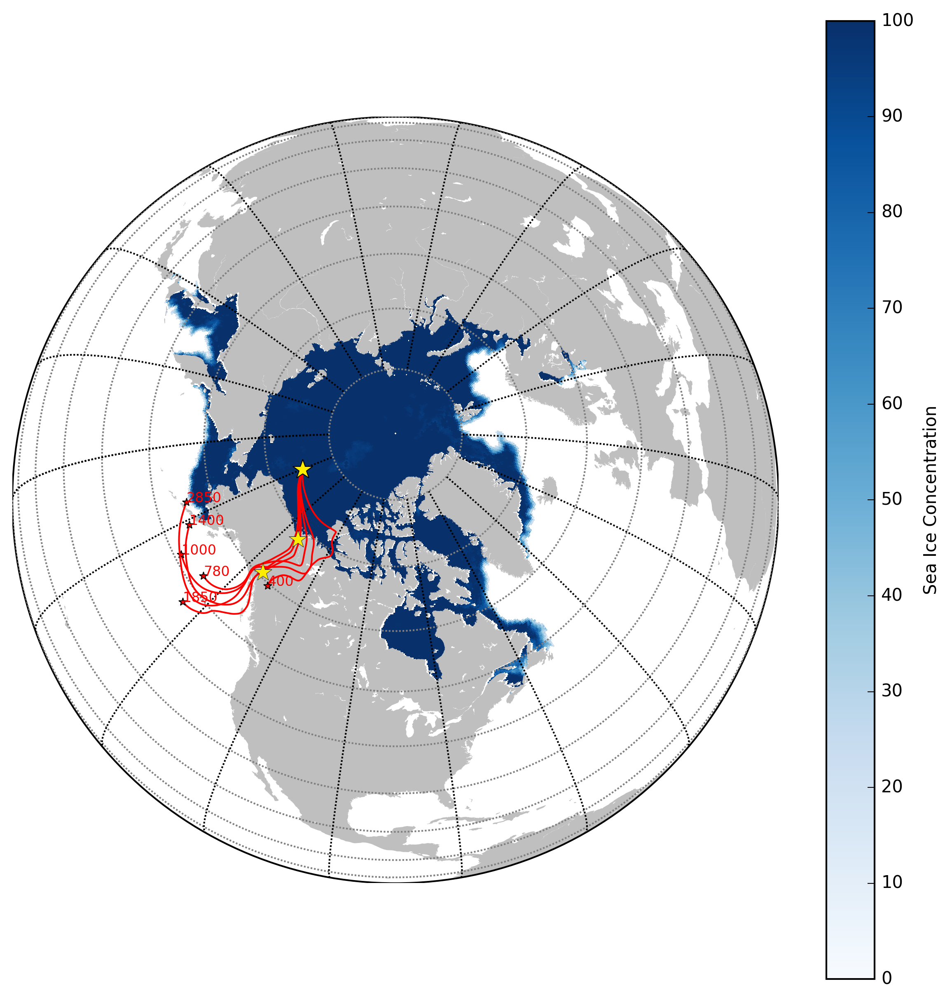

In [5]:
traj_plot(datetime(1998,2,26,23), path=path_traj,size=(10,10), pixel=300, levels=['400', '780', '1000', '1400', '1850', '2850'])

# Joint Trajectory

In [50]:
import pandas as pd
from mpl_toolkits.axes_grid1 import make_axes_locatable
def traj_plot(*dates, path, path_save=None, plot_name='traj_plot', sea_ice='Yes', stations=None, \
              save_fig=None, size=(12,10), pixel=None, title=None ,rows=7, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600']):
    
    """Function to plot trajectories for a variable dates for user specified levels with an option for sea_ice
    brackground on a single plot.
    
    Input arguments: 
    date: as a datetime.datetime object Eg, datetime(1997,12,1,23)
    path: path of data file to be plotted
    path2: path where the file is desired to be saved
    sea_ice: 'Yes' or 'Y' to plot sea_ice
    station_lats: Input lats of stations to be plotted as a list
    station_lons: Input lons of stations to be plotted as a list
    save_fig: Default doesn't save
    size: controls figure size. To be given as tuple
    pixel: Alter dpi for resolution
    title: Heading of the plot
    rows: No of rows to skip while reading the trajectory data. Default 7 but depends on number of Meteo files used while traj 
    calculation
   
    levels: to plot as a list of strings
    Eg, levels = ['400', '780', '1000', '1400', '1850', '2850', '3950', '5220', '6730', '8600'] """
    
    # path
    
    date_str = ['{:%m_%d_%H}'.format(date) for date in dates]
    #print(date_str) 
    
    # creating a basemap
    fig = plt.figure(figsize=size, dpi=pixel)
        # plt.figure(figsize=(10,8))
    ax =plt.gca()    
    m = Basemap(projection='ortho', lat_0=80, lon_0=270, resolution='l')
    
    m.drawcoastlines(color='0.75')
    #m.fillcontinents(color='0.75')
    #m.drawparallels(np.arange(-80.,81.,10.), color='grey') # lat andd lons at 20 degrees
    #m.drawmeridians(np.arange(-180.,181.,20.)) # longittudes
    
    if (sea_ice == 'Yes' or sea_ice == 'Y'):    
        # Reading Sea Ice data
        filename_ = '/home/ollie/muali/Data/G10010_SeaIce/G10010_SIBT1850_v1.1.nc'
        ds = Dataset(filename_)
        
        # to get the time index out of the netcdf variable
        # change it according to the month you want to plot
        # Eg, dec here
        # timeindex gives you the index of in the netcdf file
        
        timeindex = date2index(datetime(dates[0].year,dates[0].month,15),ds.variables['time'])
        lats_ice = ds.variables['latitude'][:]
        lons_ice = ds.variables['longitude'][:]
    
        #note that lon goes from 0 to 360
        # should we do a -180 here? No, basemap adjusts it automatically
        # creating our meshgrid according to data coordinates given

        lon_ice, lat_ice = np.meshgrid(lons_ice, lats_ice)
        # meshgrid creates a coordinate system with our axis supplied

        # getting seaice for SHEBA december as an eg but it works for all months
        sea_ice_dec = ds.variables['seaice_conc'][timeindex,:,:] # month dependent on user date
        # masking the low seaice concentration value
        # check low sea ice value by np.sea_ice_dec.mina
        # masking since min sea Ice is -1 for continents
        sea_ice_dec = np.ma.masked_where(sea_ice_dec<=0,sea_ice_dec) 
        ds.close()
        
        # plotting Sea Ice
        m.pcolormesh(lon_ice, lat_ice, sea_ice_dec, latlon=True, cmap='Blues')
        plt.clim(0, 100) # Set the color limits of the current image
        plt.colorbar(label='Sea Ice Concentration',fraction=0.046, pad=0.04)
        #divider = make_axes_locatable(ax)
        #cax = divider.append_axes("right", size="5%", pad=0.05)
        #plt.clim(0,100)
        #plt.colorbar(label='Sea Ice Concentration', cax=cax)

    
    
    all_dates = "" # to print dates in the title
    
    colors = ['#00C957', 'red', 'k', '#af5002'] #
    labels = ['04 Jan, 23:00 UTC', '10 Jan, 23:00 UTC', '12 Jan, 11:00 UTC', '28 Jan, 23:00 UTC']
    
    for i, d_ in enumerate(date_str):
       # print("\n", d_)
        for lvl in levels:
            df = pd.read_csv(path+'tdump_'+lvl+'_'+d_, skiprows=rows, header=None, delim_whitespace=True)
        
        #taking lat lons of the trajectories to be plotted
            lat = np.array(df.iloc[:, 9].copy())
            lon = np.array(df.iloc[:, 10].copy())
    
        #Convert lat lon to map coordinates
            x, y = m(lon, lat)
    
        #Plot the points on the map
            plt.plot(x, y,linewidth=1.0, color=colors[i] )
            
            # labeling single traj to avoid cluttering
            if lvl is levels[-1]:
                plt.plot(x, y,linewidth=1.0, color=colors[i], label= labels[i])      
        #source point
            xpt, ypt = m(lon[-1], lat[-1])
           # plt.plot(xpt, ypt, marker = '*', markerfacecolor=colors[i], linewidth=0, markersize=5)
            # Text
            plt.text(xpt,ypt,lvl, fontsize=8, color=colors[i])
            # plt.text(xpt,ypt,'Source (%5.1fW,%3.1fN)' % (lonpt,latpt), color='yellow', fontsize=15)
        
   
  
    # lats lons of observation stations
    stations_lats = [58.217, 70.939, 76.7689, 69.78, 67.625, 67.876, 78.92,  65.28, 68.316, 71.583, 70.616 ]
    station_lons = [-6.317, -8.667, -18.668, 61.783, 53.02, 44.17, 11.92,  -126.75, -133.516, 128.916, 147.883] 
    
    st_x, st_y = m(station_lons, stations_lats)
    plt.scatter(st_x, st_y, marker = '*', c='#ffed00', s=120, edgecolors='k', linewidths=0.7, zorder=10)
    
    #SHEBA point
    x_s, y_s = m(lon[0], lat[0])
    plt.scatter(x_s, y_s, marker = '*', c='#ffed00', edgecolors='k', linewidths=0.7, s=140, label='Observations', zorder=100)
    plt.legend()
    #plt.text(x_s,y_s,'SHEBA', color='#ffed00', fontsize=15)
    
     # plotting stations
        # Reading IGRA list
  
    # create an axes on the right side of ax. The width of cax will be 5%
    # of ax and the padding between cax and ax will be fixed at 0.05 inch.

    for date in dates:
        all_dates +='{}'.format(date)+" "
        
    if title is not None:
        plt.title(all_dates)
    if save_fig != None:
        # saving fig
        plt.savefig(path2 + plot_name + '.png')
        plt.close(fig)
    else:
        plt.show(fig)

# All cloudy, clear (paper)

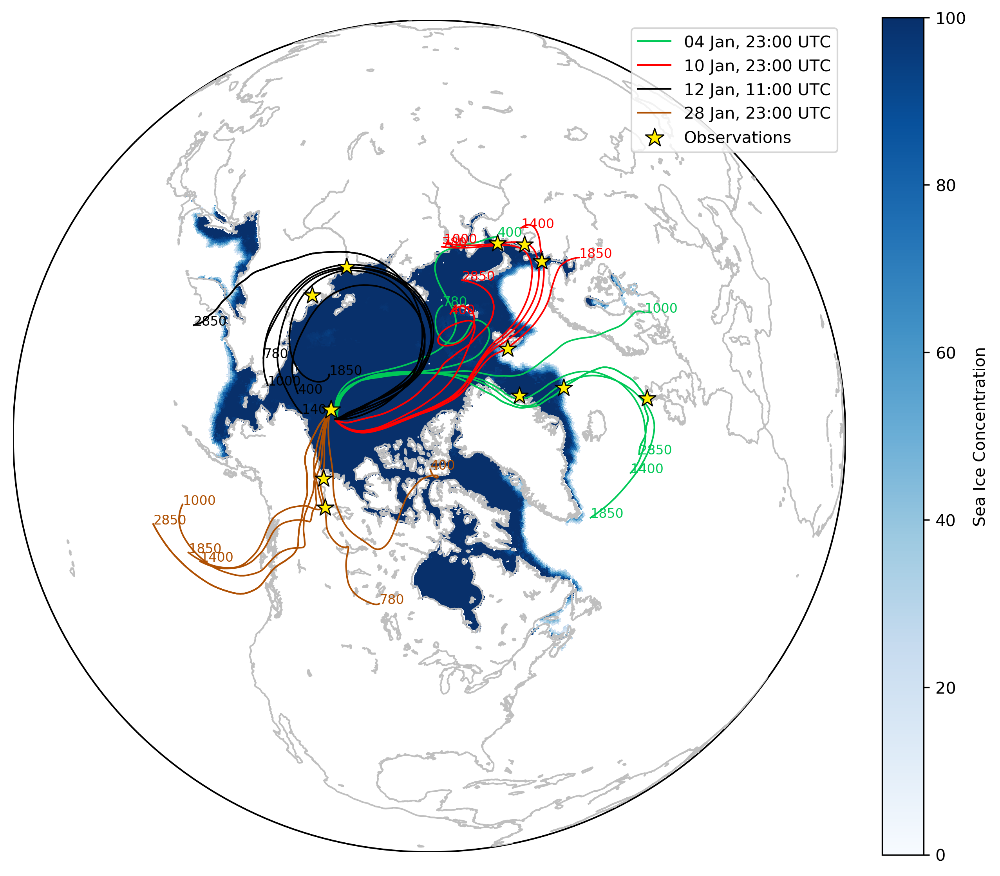

In [52]:

traj_plot(datetime(1998,1,4,23), datetime(1998,1,10,23), datetime(1998,1,12,11) ,datetime(1998,1,28,23),\
          path=path_traj,size=(10,10), pixel=300,levels=['400', '780', '1000', '1400', '1850', '2850'])

## plot Jan 04, 10, 28

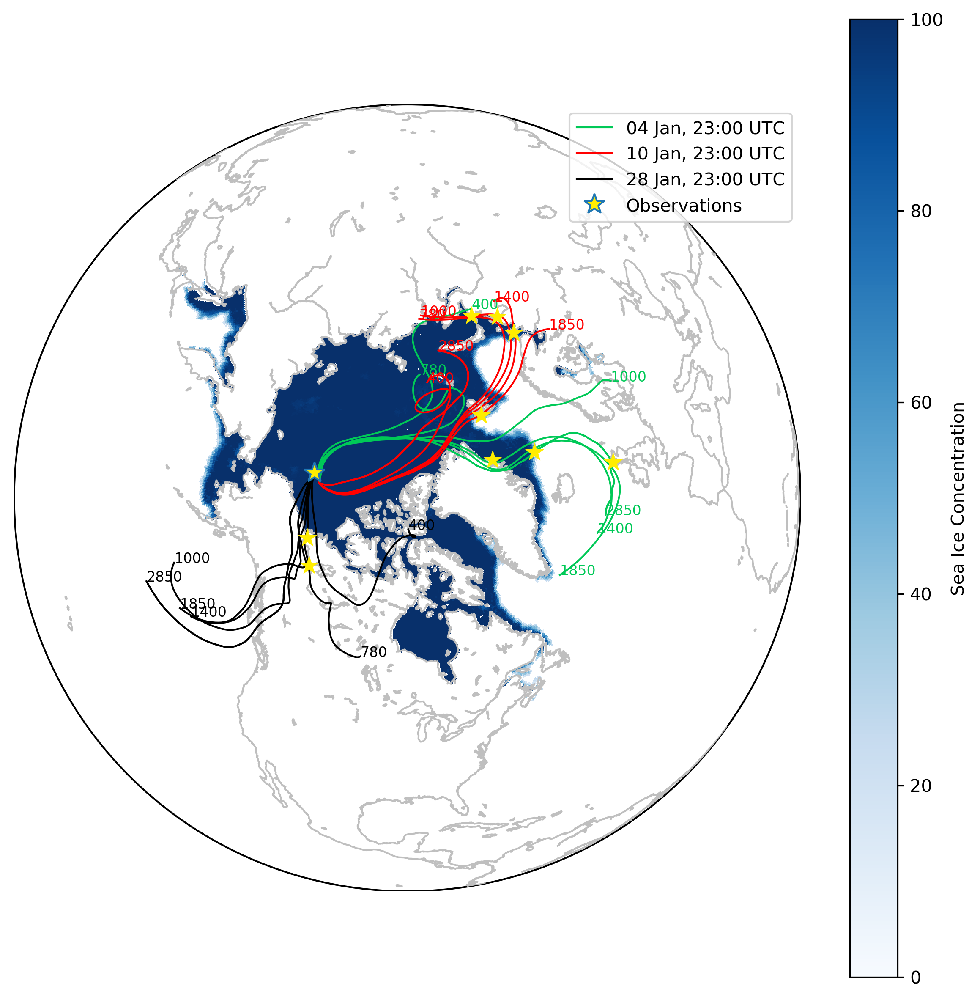

In [54]:

traj_plot(datetime(1998,1,4,23), datetime(1998,1,10,23), datetime(1998,1,12,11) ,datetime(1998,1,28,23), path=path_traj,size=(10,10), pixel=300, \
        levels=['400', '780', '1000', '1400', '1850', '2850'])